In [1]:
import numpy as np
import PySpin
import datetime
from pathlib import Path
from simple_pyspin import Camera, list_cameras

DIR_DATA = Path("C:/pylab/Data")

import logging

# Create a logger object.
logger = logging.getLogger(__name__)

class CameraError(Exception):
    pass

_SYSTEM = None

import matplotlib.pyplot as plt
import xarray as xr
import panel as pn
pn.extension(comms='vscode')
import hvplot.xarray

from scipy.ndimage import convolve1d

In [5]:
def print_camera_info(cam):
	cam_info = cam.getCameraInfo()
	print('\n*** CAMERA INFORMATION ***\n')
	print('Serial number - %d' % cam_info.serialNumber)
	print('Camera model - %s' % cam_info.modelName)
	print('Camera vendor - %s' % cam_info.vendorName)
	print('Sensor - %s' % cam_info.sensorInfo)
	print('Resolution - %s' % cam_info.sensorResolution)
	print('Firmware version - %s' % cam_info.firmwareVersion)
	print('Firmware build time - %s' % cam_info.firmwareBuildTime)
	print()

In [6]:
class CameraError(Exception):
	pass

_SYSTEM = None

class GP_camera:
	def __init__(self, camera_id=0, BIT12=False, video_mode=0, trigger_port=0, trigger_mode=0):
		#self.get_c = flycapture2.Context()
		self.shutter_time = 0
		self.num_of_images = 0
		self.run_name = ""
		self.folder_name = ""
		self.setDate()     
		self.BIT12 = BIT12
		self.camera_id = camera_id
		self.video_mode = video_mode
		self.trigger_port = trigger_port
		self.trigger_mode = trigger_mode
		logger.debug("Trigger on GPIO {}".format(self.trigger_port))
		self.c = None
		
	def setDate(self):
		self.run_time = datetime.datetime.now()
		self.date_dir = self.run_time.strftime("%Y\\%m\\%d\\")
	
	@staticmethod
	def ListCameras():
		# Get list of connected cameras for GUI
		global _SYSTEM

		if _SYSTEM is None:
			_SYSTEM = PySpin.System.GetInstance()

		cam_list = _SYSTEM.GetCameras()
		num_cams = cam_list.GetSize()
		logger.debug('Number of cameras detected: {:d}'.format(num_cams))
		res = {}
		for i, cam in enumerate(cam_list):
			device_model_name = cam.TLDevice.DeviceModelName.GetValue()
			device_serial = cam.TLDevice.DeviceSerialNumber.ToString()
			res[i] = {'i': i,'name': device_model_name, 'serial': int(device_serial), 'res': '3000x2000'}
		
		del cam
		cam_list.Clear()
		print(res)
		return res

	def InitCamera(self):
		#Connect to the camera
		self.c = Camera(index=self.camera_id) # Acquire Camera
		self.c.init() # Initialize camera

		# #Set camera properties
		#self.c.OffsetX = 0
		#self.c.OffsetY = 0

		# self.c.Width = self.c.SensorWidth//2
		# self.c.Height = self.c.SensorHeight//2
		try:
			print('initializing camera: ', self.c.get_info('DeviceSerialNumber'), "should be ", self.camera_id)
		except:
			print('Error getting camera serial number')

		# To control the exposure settings, we need to turn off auto
		self.c.GainAuto = 'Off'
		# Set the gain to 20 dB or the maximum of the camera.
		gain = min(0, self.c.get_info('Gain')['max'])
		print("Setting gain to %.1f dB" % gain)
		self.c.Gain = gain
		#self.c.ExposureAuto = 'Off'
		print(self.c.get_info('ExposureTime'))

		self.c.ExposureTime = 1000 # microseconds

		self.c.TriggerMode ='Off'
		self.c.TriggerSelector = 'FrameStart'
		print(self.c.get_info('TriggerSource'))
		self.c.TriggerSource = 'Line0'
		self.c.TriggerMode = 'On'

		#self.c.start() # Start recording
		
	def GrabImages(self, shutter=0, gain=24., number=0, runname="", foldername=""):
		self.shutter_time = shutter
		self.num_of_images = number
		self.run_name = runname
		self.folder_name = foldername
		
		#Generating image file names
		self.setDate()
		img_dir = DIR_DATA/self.date_dir/self.folder_name
		self.img_dir = img_dir
		
		img_name = []
		for pic in range(0, self.num_of_images):
			#
			if self.BIT12:
				img_name.append(img_dir/(self.run_name + "_IMG" + str(pic+1) + ".png"))
			else:
				img_name.append(img_dir/(self.run_name + "_IMG" + str(pic+1) + ".PGM"))
		# if not os.path.exists(img_dir):
		# 	os.makedirs(img_dir)
		
		#Set shutter time
		self.c.ExposureTime = float(1e3*self.shutter_time) # microseconds

		#Gain
		self.c.Gain = max(0, min(gain, 44.0))

		#Grab images
		images_file = {}
		imgbuffer = []
		metabuffer = []
		err=False
		#self.c.start() # Start recording

		for i, img in enumerate(img_name):
			logger.debug(f"Grabbing image {i} of {self.num_of_images}")
			try:
				image, meta = self.c.get_array(wait=1000)
			except:
				logger.exception('Error retrieving buffer for image {} of {}'.format(i, len(img_name)))
				err=True
			else:
				#Convert to a numpy array with the right shape
				cv_image = np.transpose(image) #np.transpose(np.array(image.getData(), dtype="uint8").reshape( (image.getRows(), image.getCols()) ) )
				imgbuffer.append(cv_image)
				images_file[img] = image
				metabuffer.append(meta)

		#self.c.stop() # Stop recording
		return (not err), imgbuffer, images_file, metabuffer
							
	def Disconnect(self):
		if self.c:
			self.c.close()
		global _SYSTEM
		_SYSTEM.ReleaseInstance()
		logger.info("Disconnected the camera.")

	def __del__(self):
		if self.c:
			self.c.close()
		global _SYSTEM
		_SYSTEM.ReleaseInstance()
		logger.info("Deleted the camera.")

	def __exit__(self, type, value, traceback):
		self.c.close()
		global _SYSTEM
		_SYSTEM.ReleaseInstance()
		logger.info("Closed the camera.")


In [7]:
GP_camera.ListCameras()

{0: {'i': 0, 'name': 'Blackfly S BFS-PGE-31S4M', 'serial': 22071256, 'res': '3000x2000'}, 1: {'i': 1, 'name': 'Flea3 FL3-U3-13S2M', 'serial': 13152783, 'res': '3000x2000'}}


{0: {'i': 0,
  'name': 'Blackfly S BFS-PGE-31S4M',
  'serial': 22071256,
  'res': '3000x2000'},
 1: {'i': 1,
  'name': 'Flea3 FL3-U3-13S2M',
  'serial': 13152783,
  'res': '3000x2000'}}

In [8]:
cam = GP_camera(camera_id='13152783') # Flea3 '13152783' PGE '22071256'

In [9]:
cam.InitCamera()

initializing camera:  {'name': 'DeviceSerialNumber', 'type': 'string', 'access': 'read only', 'value': '13152783', 'description': 'Device serial number. This string is a unique identifier of the device.'} should be  13152783
Setting gain to 0.0 dB
{'name': 'ExposureTime', 'type': 'float', 'access': 'read/write', 'value': 1002.0732879638672, 'description': 'Exposure time in microseconds when Exposure Mode is Timed and ExposureAuto is Off.', 'unit': 'us', 'min': 7.62939453125, 'max': 499864.5782470703}
{'name': 'TriggerSource', 'type': 'enum', 'access': 'read/write', 'value': 'Line0', 'description': 'Specifies the internal signal or physical input line to use as the trigger source. The selected trigger must have its TriggerMode set to On.', 'entries': ['Software', 'Line0', 'Line1', 'Line2', 'Line3']}


In [10]:
cam.c.stop()

In [11]:
cam.c.get_info('Width')

{'name': 'Width',
 'type': 'int',
 'access': 'read/write',
 'value': 192,
 'description': 'Width of the image provided by the device (in pixels).',
 'unit': '',
 'min': 16,
 'max': 672}

In [12]:
cam.c.get_info('Height')

{'name': 'Height',
 'type': 'int',
 'access': 'read/write',
 'value': 192,
 'description': 'Height of the image provided by the device (in pixels).',
 'unit': '',
 'min': 2,
 'max': 498}

In [13]:
def round4(i):
    return int(np.round(i/4))*4

def round16(i):
    return int(np.round(i/16))*16

In [14]:
# w = 100
# x0, y0 = 676, 400
# cam.c.Width = w
# cam.c.Height = w
w = round16(100)
# x0, y0 = 600+120, 523+80
x0, y0 = 763, 625
# x0, y0 = 1072+50, 974+50
cam.c.Width = w
cam.c.Height = w
cam.c.OffsetX = round4(x0 - w//2)
cam.c.OffsetY = round4(y0 - w//2)

In [15]:
cam.c.get_info('DecimationHorizontal')

{'name': 'DecimationHorizontal', 'type': 'int', 'access': 0}

In [16]:
cam.c.get_info('DecimationVertical')

{'name': 'DecimationVertical', 'type': 'int', 'access': 0}

In [17]:
cam.c.BinningVertical = 1
cam.c.get_info('BinningVertical')

{'name': 'BinningVertical',
 'type': 'int',
 'access': 'read/write',
 'value': 1,
 'description': 'Number of vertical pixels to combine together.',
 'unit': '',
 'min': 1,
 'max': 2}

In [18]:
cam.c.get_info('BinningHorizontal')

{'name': 'BinningHorizontal',
 'type': 'int',
 'access': 'read only',
 'value': 1,
 'description': 'Number of horizontal pixels to combine together.',
 'unit': '',
 'min': 1,
 'max': 2}

In [19]:
cam.c.get_info('OffsetX')

{'name': 'OffsetX',
 'type': 'int',
 'access': 'read/write',
 'value': 716,
 'description': 'Vertical offset from the origin to the AOI (in pixels).',
 'unit': '',
 'min': 0,
 'max': 1232}

In [20]:
# cam.c.stop()
# _width = cam.c.get_info('Width')
# _height = cam.c.get_info('Height')
# cam.c.OffsetX = 0
# cam.c.OffsetY = 0
# cam.c.Width = _width['max']
# cam.c.Height = _height['max']


In [21]:
# cam.c.PixelFormat  = 'Mono16'
cam.c.PixelFormat  = 'Mono8'

In [22]:
cam.c.get_info('PixelFormat')

{'name': 'PixelFormat',
 'type': 'enum',
 'access': 'read/write',
 'value': 'Mono8',
 'description': 'Format of the pixel data.',
 'entries': ['Mono8',
  'Mono12Packed',
  'Mono12p',
  'Mono16',
  'BayerGR8',
  'BayerRG8',
  'BayerGB8',
  'BayerBG8',
  'BayerGR12p',
  'BayerRG12p',
  'BayerGB12p',
  'BayerBG12p',
  'BayerGR12Packed',
  'BayerRG12Packed',
  'BayerGB12Packed',
  'BayerBG12Packed',
  'BayerGR16',
  'BayerRG16',
  'BayerGB16',
  'BayerBG16',
  'CbYYCrYY',
  'CbYCrY',
  'CbYCr',
  'RGB8'],
 'entry_descriptions': ['Pixel format set to Mono 8.',
  'Pixel format set Mono 12 IIDC-msb Packed.',
  'Pixel format set to 12-bit monochrome pixel lsb packed.',
  'Pixel format set to Mono 16.',
  'Pixel format set to Bayer GR 8.',
  'Pixel format set to Bayer RG 8.',
  'Pixel format set to Bayer GB 8.',
  'Pixel format set to Bayer BG 8.',
  'Pixel format set to 12-bit bayer GR lsb packed.',
  'Pixel format set to 12-bit bayer RG lsb packed.',
  'Pixel format set to 12-bit bayer GB lsb

In [23]:
cam.c.get_info('TriggerSource')

{'name': 'TriggerSource',
 'type': 'enum',
 'access': 'read/write',
 'value': 'Line0',
 'description': 'Specifies the internal signal or physical input line to use as the trigger source. The selected trigger must have its TriggerMode set to On.',
 'entries': ['Software', 'Line0', 'Line1', 'Line2', 'Line3']}

In [24]:
cam.c.TriggerMode ='Off'

In [25]:
cam.c.TriggerSource = 'Line0'

In [26]:
cam.c.TriggerActivation = 'FallingEdge'
cam.c.get_info('TriggerActivation')

{'name': 'TriggerActivation',
 'type': 'enum',
 'access': 'read/write',
 'value': 'FallingEdge',
 'description': 'Specifies the activation mode of the trigger.',
 'entries': ['RisingEdge', 'FallingEdge']}

In [27]:
cam.c.TriggerDelay = 0 #1000.0
cam.c.get_info('TriggerDelay')

{'name': 'TriggerDelay',
 'type': 'float',
 'access': 'read/write',
 'value': 0.0,
 'description': 'Specifies the delay (in microseconds) to apply after the trigger reception before activating it.',
 'unit': 'us',
 'min': 0.0,
 'max': 0.0}

In [28]:
cam.c.TriggerMode ='On'

In [29]:

cam.c.get_info('TriggerMode')

{'name': 'TriggerMode',
 'type': 'enum',
 'access': 'read/write',
 'value': 'On',
 'description': 'Controls whether or not the selected trigger is active.',
 'entries': ['Off', 'On']}

In [30]:
cam.c.get_info('TriggerSelector')

{'name': 'TriggerSelector',
 'type': 'enum',
 'access': 'read/write',
 'value': 'FrameStart',
 'description': 'Selects the type of trigger to configure.',
 'entries': ['FrameStart', 'ExposureActive']}

In [31]:
cam.c.Gain = 5
cam.c.get_info('Gain')

{'name': 'Gain',
 'type': 'float',
 'access': 'read/write',
 'value': 5.001240253448486,
 'description': 'Gain applied to the image in dB.',
 'unit': 'dB',
 'min': 0.0,
 'max': 18.061790466308594}

In [32]:
cam.c.AcquisitionMode = 'MultiFrame'
cam.c.get_info('AcquisitionMode')


{'name': 'AcquisitionMode',
 'type': 'enum',
 'access': 'read/write',
 'value': 'MultiFrame',
 'description': 'Sets the acquisition mode of the device.',
 'entries': ['Continuous', 'SingleFrame', 'MultiFrame']}

In [33]:
cam.c.get_info('AcquisitionFrameCount')


{'name': 'AcquisitionFrameCount',
 'type': 'int',
 'access': 'read/write',
 'value': 1,
 'description': 'Number of frames to acquire in multi-frame acquisition mode.',
 'unit': '',
 'min': 1,
 'max': 65535}

In [183]:
w = round16(50)
binning = 2
# x0, y0 = 600+120, 523+80
# x0, y0 = 763, 625
x0, y0 = 1072-15, 974 - 15
cam.c.Width = w
cam.c.Height = w
ox = x0 - w//2
oy = y0 - w//2
cam.c.OffsetX = round4(ox//2)
cam.c.OffsetY = round4(oy//2)

In [34]:
# w = 100
# x0, y0 = 676, 400
# cam.c.Width = w
# cam.c.Height = w
w = round16(192)
# x0, y0 = 600+120, 523+80
x0, y0 = 743, 650
# x0, y0 = 1072+50, 974+50
cam.c.Width = w
cam.c.Height = w
cam.c.OffsetX = round4(x0 - w//2)
cam.c.OffsetY = round4(y0 - w//2)

In [35]:
cam.c.ExposureTime = 1000.0

In [36]:
cam.c.AcquisitionFrameCount = 1
cam.c.get_info('AcquisitionFrameCount')


{'name': 'AcquisitionFrameCount',
 'type': 'int',
 'access': 'read/write',
 'value': 1,
 'description': 'Number of frames to acquire in multi-frame acquisition mode.',
 'unit': '',
 'min': 1,
 'max': 65535}

In [37]:
cam.c.start()
image, meta = cam.c.get_array(wait=4000)
cam.c.stop()

In [38]:
meta

(0, 2580163154581)

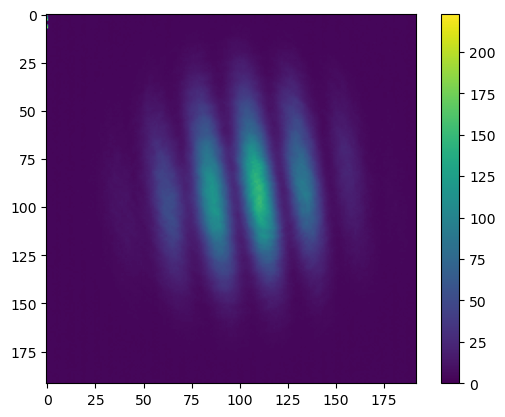

In [39]:
plt.figure()
plt.imshow(image.T)
plt.colorbar()
plt.show()


In [40]:
np.quantile(image, 0.99)

111.0

In [180]:
# load the probe points from the xarray

# fname = 'phasemaps/probe_points_20x16x5_20240521.nc'
# fname = 'phasemaps/probe_points_24x20x5_20240521.nc'
# fname = 'phasemaps/probe_points_16x12x3_20240528.nc'
# fname = 'phasemaps/probe_points_24x20x5_20240528.nc'
fname = 'phasemaps/probe_points_32x24x5_20240529.nc'


xr_prb = xr.open_dataarray(fname)

Npre = xr_prb.attrs['Npre']
Nholograms = xr_prb.attrs['Nholograms']
Nframes = int((Nholograms + Npre))
assert Nframes == xr_prb.attrs['Nframes']
Nframes

3849

In [181]:
xr_prb.close()

In [182]:
x_prb = xr_prb.x_prb
y_prb = xr_prb.y_prb
Nphase = xr_prb.phase.size
offs_phases = xr_prb.phase

In [183]:
cam.c.AcquisitionFrameCount = Nframes
cam.c.get_info('AcquisitionFrameCount')


{'name': 'AcquisitionFrameCount',
 'type': 'int',
 'access': 'read/write',
 'value': 3849,
 'description': 'Number of frames to acquire in multi-frame acquisition mode.',
 'unit': '',
 'min': 1,
 'max': 65535}

In [184]:
cam.c.start()
# time.sleep(0.1)
err, imbuffer, imfiles, metabuffer = cam.GrabImages(shutter=1.0, gain=5.0, number=Nframes, runname="test1", foldername="LG")
cam.c.stop()

In [146]:
metabuffer = []
imbuffer = []
cam.c.start()
for i in range(Nframes):
    #logger.debug(f"Grabbing image {i} of {Nframes}")
    try:
        image, meta = cam.c.get_array(wait=400)
    except:
        logger.exception('Error retrieving buffer for image {} of {}'.format(i, Nframes))
        err=True
    else:
        #Convert to a numpy array with the right shape
        cv_image = np.transpose(image) #np.transpose(np.array(image.getData(), dtype="uint8").reshape( (image.getRows(), image.getCols()) ) )
        imbuffer.append(cv_image)
        metabuffer.append(meta)
cam.c.stop()

(array([1094.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
        2755.]),
 array([ 0.       ,  1.7214641,  3.4429282,  5.1643923,  6.8858564,
         8.6073205, 10.3287846, 12.0502487, 13.7717128, 15.4931769,
        17.214641 ]),
 <BarContainer object of 10 artists>)

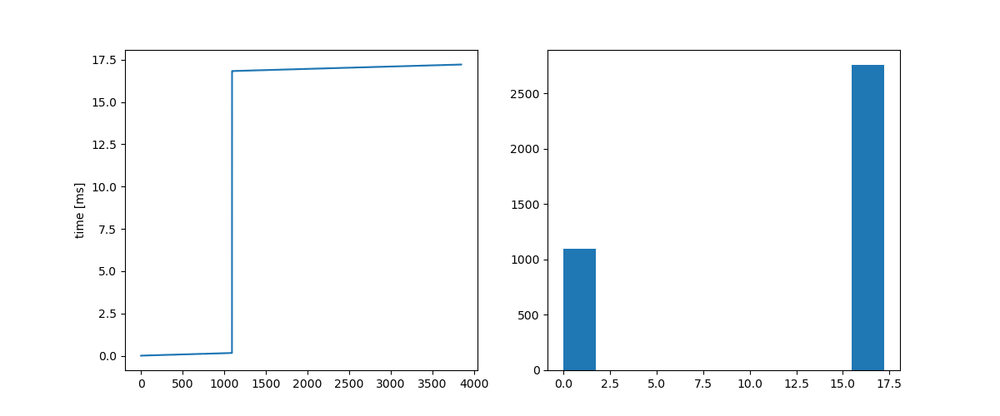

In [185]:
meta_arr = np.array(metabuffer)
times = meta_arr[:,1] - meta_arr[0,1]

fps = 1.0/(np.diff(times)*1e-9)
fps, np.mean(fps)

# plt.figure()
f, ax = plt.subplots(ncols=2, figsize=(12, 5))
# ax[0].plot(times*1e-6, marker='.', ls='none')
t_expect = np.arange(Nframes)*1e3/(60)
# ax[0].plot(np.arange(Nframes), t_expect, ls=':')
ax[0].set_ylabel('time [ms]')
ax[0].plot(times*1e-6 - t_expect)

# plt.figure()
# ax[1].hist(fps - np.mean(fps))
ax[1].hist(times*1e-6 - t_expect)

In [186]:
# there are discontinuities in the time stamps because the camera misses some triggers!
# we can detect when the time jumps and correct for it by inserting the missing frames as a zero frame
# first find the indices from the derivative of times, make a copy of the image buffer and insert the missing frames and then truncate the images at the end
d_times = np.diff(times)
t_mean = np.median(d_times)
idx = np.where(d_times > 1.5*t_mean)[0]

imbuffer_corr = imbuffer.copy()
times_corr = times.copy()
for i in idx:
    imbuffer_corr.insert(i, np.zeros_like(imbuffer[0]))
    times_corr = np.insert(times_corr, i, times_corr[i-1] + t_mean)

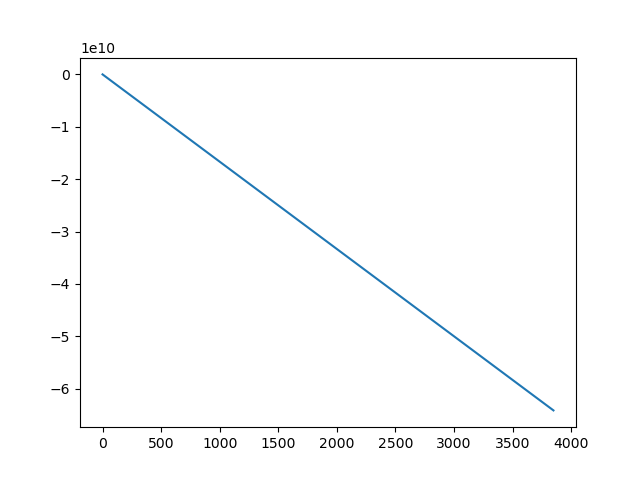

In [187]:
plt.figure()
plt.plot(times_corr*1e-6 - np.arange(len(times_corr))*t_mean)

In [188]:
# allims = np.array(imbuffer)
# now truncate the corrected images to Nframes to not have doubles
allims = np.array(imbuffer_corr[:Nframes])

In [189]:
allims.shape

(3849, 400, 400)

(3849,) (3849,)
1559


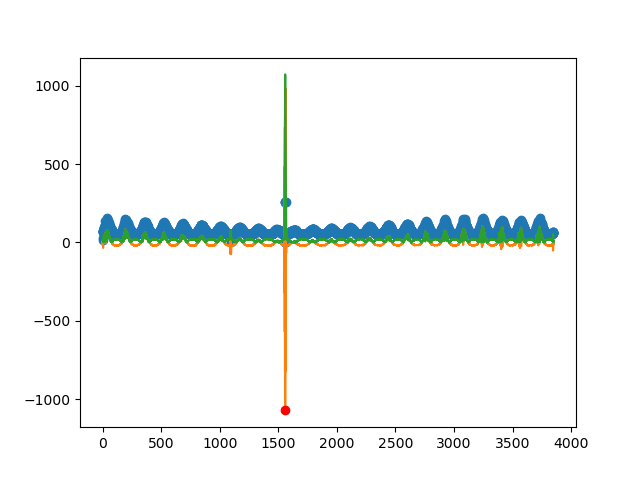

In [190]:
# intens = np.max(np.max(allims, axis=-1), axis=-1)
intens = np.quantile(allims, q=0.99, axis=(1,2))
pattern = np.zeros(Npre)
for i in range(Npre):
    if i%2:
        pattern[i] = -1
    else:
        pattern[i] = 1

# corr = np.convolve(intens, pattern, mode='same')
corr = convolve1d(intens-np.mean(intens), pattern, mode='wrap')

pk = np.argmax(np.abs(corr))
print(corr.shape, intens.shape)

plt.figure()
plt.plot(intens, marker='o')
plt.plot(corr)
plt.plot(np.abs(corr))
# plt.xlim(pk-20, pk+20)
plt.plot(pk, corr[pk], 'ro')
print(pk)

In [191]:
start = pk + Npre//2 + 1
start

1564

In [192]:
allims = np.roll(allims, -start, axis=0)

In [193]:
wx = int(allims.shape[1])
wy = int(allims.shape[2])
# add two new dimensions to xr_prb to hold the x and y image data and add corresponding x and y image coordinates
xr_ims = xr_prb.expand_dims({'x': np.arange(wx), 'y': np.arange(wy)}, axis=(-2,-1))
xr_ims.data = np.moveaxis(allims[:Nholograms].reshape((Nphase, xr_prb.x_prb.size, xr_prb.y_prb.size, wx, wy), order='F'),0, 2)
# np.moveaxis(allims[:Nholograms].reshape((Nphase, xr_prb.x_prb.size, xr_prb.y_prb.size, w, w), order='F'),0, 2).shape
# ds = xr.DataArray(allims[:Nholograms].reshape((Nphase, xr_prb.x.size, xr_prb.y.size, w, w), order='F'), 
#                   coords={'phase': offs_phases, 'DMD_Prb_X': x_prb, 'DMD_Prb_Y': y_prb, 'x': np.arange(w), 'y': np.arange(w)},
#                   dims=['phase', 'DMD_Prb_X', 'DMD_Prb_Y', 'x', 'y'])

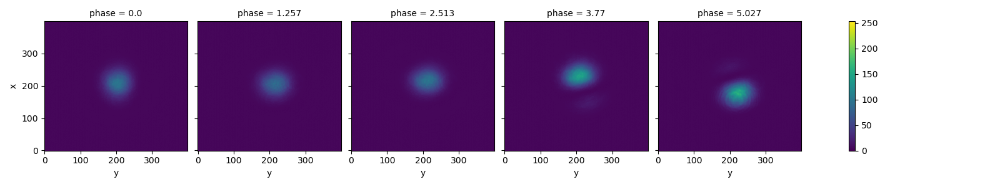

In [194]:
xr_ims.isel(x_prb=16, y_prb=12).plot(col='phase')

In [195]:
xr_ims.hvplot(x='x', y='y', data_aspect=1, cmap='viridis')

BokehModel(combine_events=True, render_bundle={'docs_json': {'84267dc8-e06b-4a7b-b6fa-8295011e088a': {'version…

In [196]:
img_mean = xr_ims.mean(dim=['x_prb', 'y_prb', 'phase'])

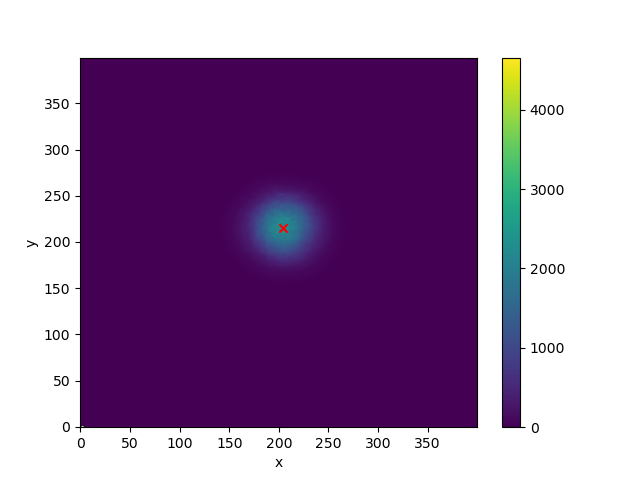

In [202]:
plt.figure()
xr_ims.var(dim='phase').mean(dim=['x_prb', 'y_prb']).plot(x='x')
plt.scatter(x0, y0, c='r', marker='x')
plt.show()

In [198]:
from skimage.restoration import unwrap_phase

In [199]:
def split_ds(ds):
    _im = ds['mean'].sel(layer='u_i')
    # check if amplitude data present
    if 'DMD_mode' in ds.dims:
        return _im.sel(DMD_mode=1), _im.sel(DMD_mode=2)
    else:
        return _im, None
    
def crop_center(imgs_abb, w0 = 10, plot=True):
    
    # img_mean = imgs_abb.mean(dim=['x_prb', 'y_prb', 'phase'])
    img_mean = imgs_abb.var(dim='phase').mean(dim=['x_prb', 'y_prb'])
    # gmean = Gaussian2D()
    # gmean.fit(img_mean, coords=['x', 'y'], skipna=False)
    # if plot:
    #     f,ax = plt.subplots()
    #     img_mean.plot()
    #     gmean.plot().plot.contour()
    # mux, muy = gmean.fit_coeff.sel(param=['mu_x','mu_y']).data
    n = img_mean.sum()
    mux = (img_mean*imgs_abb.coords['x']).sum()/n
    muy = (img_mean*imgs_abb.coords['y']).sum()/n
    
    x0, y0 = int(mux), int(muy)
    im_cent=imgs_abb.sel(x=slice(x0-w0,x0+w0), y=slice(y0-w0,y0+w0))
    return im_cent, (x0, y0, w0)

def compute_phase(allims, offs_phases=None, numPhases=3):
    
    # dd = 'phase'
    # numPhases = len(allims.coords[dd])
    # offs_phases = np.array([i*2.*np.pi/numPhases for i in range(numPhases)])
    # phis = allims.coords[dd].data

    # if offs_phases is None:
    #     offs_phases = phis

    offs_phases = allims.phase

    # num = np.einsum('ijkxy,k',allims,np.sin(offs_phases))
    # den = np.einsum('ijkxy,k',allims,np.cos(offs_phases))
    num = xr.dot(allims, np.sin(offs_phases), dims=['phase'])
    den = xr.dot(allims, np.cos(offs_phases), dims=['phase'])

    phase = np.arctan2(den,num)
    return phase

def fit_2d_linear(phase, slc, dx, dy, pidx):
    numRows = phase.shape[0]
    numCols = phase.shape[1]
    nx = phase.shape[2]
    ny = phase.shape[2]
    #2d linear fit to data 
    _x = np.linspace(-dx,dx,nx)[slc]
    _y = np.linspace(-dy,dy,ny)[slc]
    X,Y = np.meshgrid(_x,_y,indexing='ij')
    A = np.stack([np.ones(len(_x)*len(_y)),X.flatten(), Y.flatten()],axis=-1)
    allcoefs = np.empty((numRows, numCols, 3))
    for i in range(numRows):
        for j in range(numCols):
            _unwrapped = unwrap_phase(phase[i,j,slc,slc])
            _phase_c = phase[i,j,slc,slc][pidx,pidx]
            _unwrapped += (_phase_c - _unwrapped[pidx,pidx])
            coef, _, _, _ = np.linalg.lstsq(A, _unwrapped.flatten(),rcond=None)
            allcoefs[i,j,:] = coef
    return allcoefs

def make_grid(ds, debug=False):
    holo_grating_kwargs = {'a':2, 'd':8, 'angle_deg':120., 'aoi_deg':58}
    aoi_deg = holo_grating_kwargs['aoi_deg']
    dmd = DLP6500(aoi_deg=aoi_deg)

    # col_pixel_lst = ds.coords['DMD_Prb_X'].data + DMD_cols/2
    # row_pixel_lst = ds.coords['DMD_Prb_X'].data + DMD_rows/2
#     col_smpl_lst = ds.coords['DMD_Prb_X']
#     row_smpl_lst = ds.coords['DMD_Prb_Y']

#     xs, ys = np.meshgrid(ds.coords['DMD_Prb_X'].data, ds.coords['DMD_Prb_Y'].data)

#     col_smpl_lst = xs + dmd.numCols/2
#     row_smpl_lst = ys + dmd.numRows/2

#     col_smpl_dmd = dmd.pixelCol_to_xCoord(col_smpl_lst)
#     row_smpl_dmd = dmd.pixelRow_to_yCoord(row_smpl_lst)

    # from the holomaker class
    xs = dmd.pixelCol_to_xCoord(np.arange(dmd.numCols))
    ys = dmd.pixelRow_to_yCoord(np.arange(dmd.numRows))

    col_pixel_dmd, row_pixel_dmd = np.meshgrid(xs,ys, indexing='ij')
    
    if False:
        plt.figure()
        # plt.scatter(col_pixel_lst, row_pixel_lst, marker='.')
        plt.scatter(col_pixel_dmd, row_pixel_dmd, marker='.')
        plt.scatter(col_smpl_dmd, row_smpl_dmd, marker='.')
        
    xmin = dmd.pixelCol_to_xCoord(0)
    xmax = dmd.pixelCol_to_xCoord(dmd.numCols)


    ymin = dmd.pixelRow_to_yCoord(0)
    ymax = dmd.pixelRow_to_yCoord(dmd.numRows)
    print(xmin, xmax, ymin, ymax)

    xs, ys = np.meshgrid(ds.coords['x_prb'].data, ds.coords['y_prb'].data, indexing='ij')
    col_smpl_lst = xs + dmd.numCols/2
    row_smpl_lst = ys + dmd.numRows/2
    col_smpl_dmd = dmd.pixelCol_to_xCoord(col_smpl_lst)
    row_smpl_dmd = dmd.pixelRow_to_yCoord(row_smpl_lst)

    xv = col_smpl_dmd/xmax
    yv = row_smpl_dmd/ymax
    
    if debug:
        plt.figure()
        # plt.scatter(col_pixel_lst, row_pixel_lst, marker='.')
        plt.scatter(col_pixel_dmd, row_pixel_dmd, marker='.')
        plt.scatter(col_smpl_dmd, row_smpl_dmd, marker='.')
        plt.axhline(ymin, color='grey')
    
    return xv, yv, dmd, (col_smpl_dmd, row_smpl_dmd), (col_pixel_dmd, row_pixel_dmd)

def phase_complete(ds, debug=True):
    imgs_abb, imgs_ampl = split_ds(ds)
    im_cent, (x0, y0, w0) = crop_center(imgs_abb)
    phase = compute_phase(im_cent)
    
    allcoefs = fit_2d_linear(phase, slc=slice(None, None), dx=w0, dy=w0, pidx=w0)
    phase_fit = unwrap_phase(allcoefs[:,:,0])


    if debug:
        f,ax = plt.subplots(ncols = 3, figsize=(12,4))
        _im = ax[0].imshow(phase_fit.T, interpolation='none', aspect='auto', cmap='viridis', origin='lower')
        plt.colorbar(_im,ax=ax[0])
        ax[1].imshow(allcoefs[:,:,1].T, interpolation='none', aspect='auto', cmap='viridis', origin='lower')
        ax[2].imshow(allcoefs[:,:,2].T, interpolation='none', aspect='auto', cmap='viridis', origin='lower')
        
    xv, yv, dmd = make_grid(im_cent)
    
    phaseMap = phase_fit
    phaseMap -= np.mean(phaseMap)
    mask = np.zeros_like(phaseMap)

    numCols = im_cent.coords['x_prb'].size
    numRows = im_cent.coords['y_prb'].size

    # mask[:,-1] = 1 # right edge
    mask[numCols//2-1:numCols//2+1, numRows//2-1:numRows//2+1] = 1 # center 4
    # mask[-1,:] = 1 # bottom edge
    mask[-1, -4:] = 1
    mask[-2:, -1] = 1

    ain = np.ma.array(phaseMap, mask=mask)
    # if debug:
    #     f,ax = plt.subplots()
    #     _im = ax.imshow(ain.T, origin='lower', interpolation='none', aspect='auto', cmap='RdBu')
    #     plt.colorbar(_im,ax=ax)
        
    fit_plt, c1 = fit_zernike(ain)
    
    plt.figure()
    plt.bar(np.arange(len(c1)),c1)
    
    return c1

In [200]:
debug=True
imgs_abb = xr_ims.transpose('x_prb', 'y_prb', 'phase', 'x', 'y') #, imgs_ampl = split_ds(ds)
im_cent, (x0, y0, w0) = crop_center(imgs_abb, w0=20, plot=debug)
phase = compute_phase(im_cent, offs_phases=offs_phases)


In [201]:

phase.hvplot(x='x', y='y', data_aspect=1)


BokehModel(combine_events=True, render_bundle={'docs_json': {'3877b453-45a7-40e0-a83b-7c8fe4ca53da': {'version…

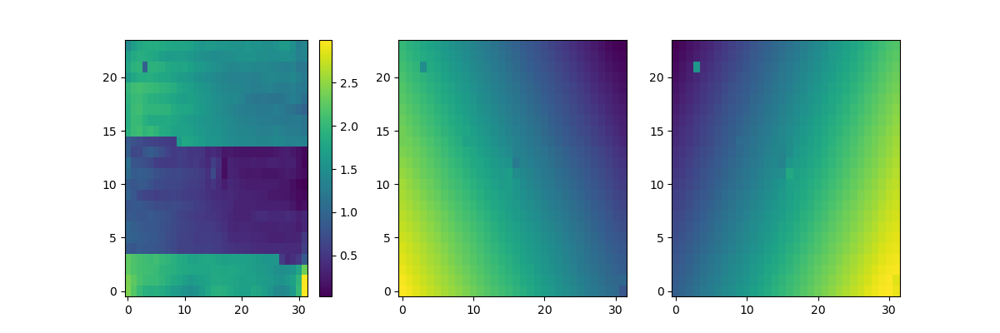

In [203]:

allcoefs = fit_2d_linear(phase.data, slc=slice(None, None), dx=w0, dy=w0, pidx=w0)
phase_fit = unwrap_phase(allcoefs[:,:,0])

if debug:
    f,ax = plt.subplots(ncols = 3, figsize=(12,4))
    _im = ax[0].imshow(phase_fit.T, interpolation='none', aspect='auto', cmap='viridis', origin='lower')
    plt.colorbar(_im,ax=ax[0])
    ax[1].imshow(allcoefs[:,:,1].T, interpolation='none', aspect='auto', cmap='viridis', origin='lower')
    ax[2].imshow(allcoefs[:,:,2].T, interpolation='none', aspect='auto', cmap='viridis', origin='lower')
    


In [108]:
%matplotlib widget

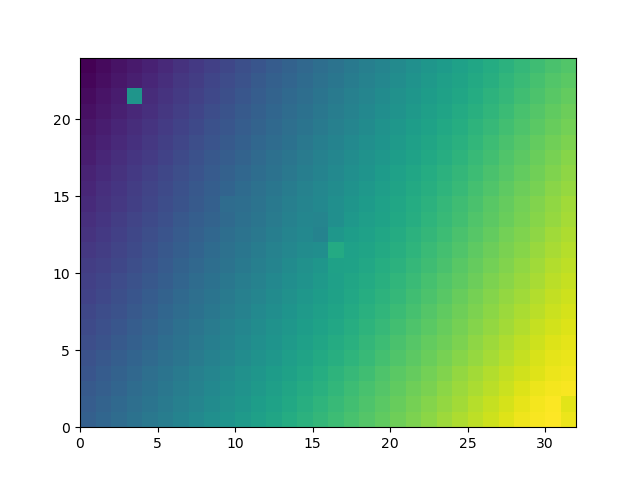

In [207]:
# Create the figure and axes
fig, ax = plt.subplots()

# Plot the image using pcolormesh
im = ax.pcolormesh(allcoefs[:,:,2].T, cmap='viridis')
# im = ax.pcolormesh(phase_fit.T, cmap='viridis')
# Set up the interactive mode
plt.ion()

mask_pixels = []

# Function to handle mouse click events
def onclick(event):
    if event.button == 1:  # Left mouse button
        # Get the clicked pixel coordinates
        x, y = int(event.xdata), int(event.ydata)

        # Add the pixel to the mask
        mask_pixels.append((x, y))
        
        # Get the pixel value
        pixel_value = image[y, x]
        ax.scatter(x+0.5, y+0.5, color='red', marker='x')
        
        # Print the clicked pixel coordinates and value
        # print(f"Clicked pixel: ({x}, {y}), Value: {pixel_value}")

# Connect the onclick function to the figure
cid = fig.canvas.mpl_connect('button_press_event', onclick)

# Show the plot
plt.show()

In [208]:
mask_pixels

[(3, 21),
 (16, 11),
 (15, 11),
 (15, 12),
 (16, 12),
 (9, 14),
 (31, 1),
 (31, 0),
 (31, 0),
 (30, 1),
 (30, 0),
 (30, 0)]

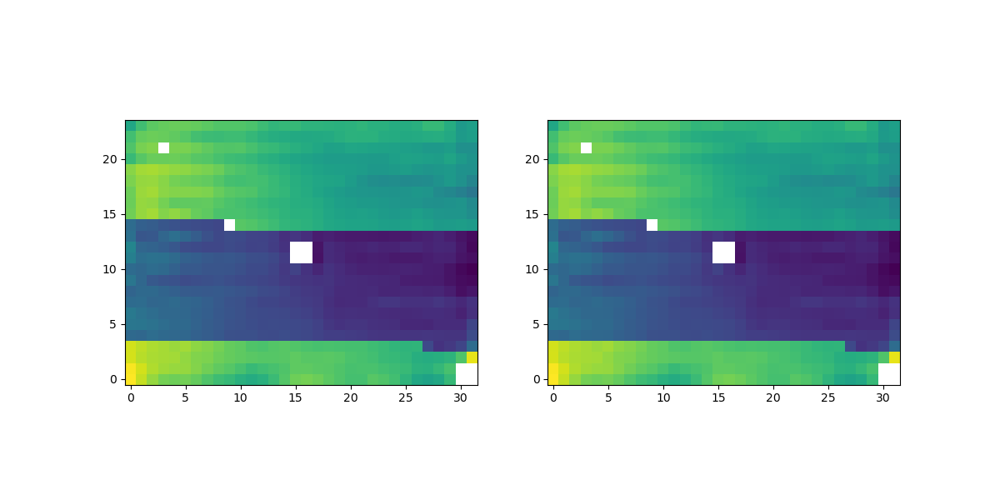

In [209]:
phase_raw = allcoefs[:,:,0]
mask = np.zeros_like(phase_raw)

for x, y in mask_pixels:
    mask[x, y] = 1

phase_masked = np.ma.array(phase_raw, mask=mask)

f, ax = plt.subplots(ncols=2, figsize=(12,6))
ax[0].imshow(phase_masked.T, cmap='viridis', origin='lower')
ax[1].imshow(unwrap_phase(phase_masked).T, cmap='viridis', origin='lower')

In [112]:
from zernike import RZern

In [113]:
from dmd import DLP6500

In [114]:
_ux = xr_prb.x_prb/xr_prb.xmax
_uy = xr_prb.y_prb/xr_prb.ymax

In [115]:
xv, yv = np.meshgrid(_ux, _uy, indexing='ij')

In [116]:
dmd1 = DLP6500(sharpness=2, period=xr_prb.period, angle=xr_prb.angle, beta_deg=xr_prb.beta)
UX = dmd1.X/xr_prb.xmax
UY = dmd1.Y/xr_prb.ymax

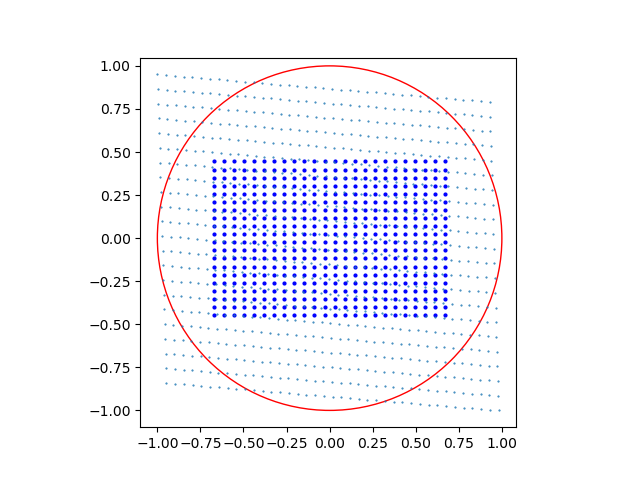

In [117]:
fig, ax = plt.subplots()
ax.set_aspect('equal')
ax.scatter(xv, yv, c='blue', s=4)
circle = plt.Circle((0, 0), 1, color='r', fill=False)
ax.add_artist(circle)
step=50
ax.scatter(UX[::step, ::step], UY[::step, ::step], s=1, marker='.')

In [118]:
from scipy.interpolate import RegularGridInterpolator

In [169]:
phase_in = unwrap_phase(phase_raw)
# phase_in[-1,10] = phase_in[-1,9]
# phase_in[-1,11] = phase_in[-1,12]
interp = RegularGridInterpolator((_ux, _uy), phase_in, bounds_error=False, fill_value=None)

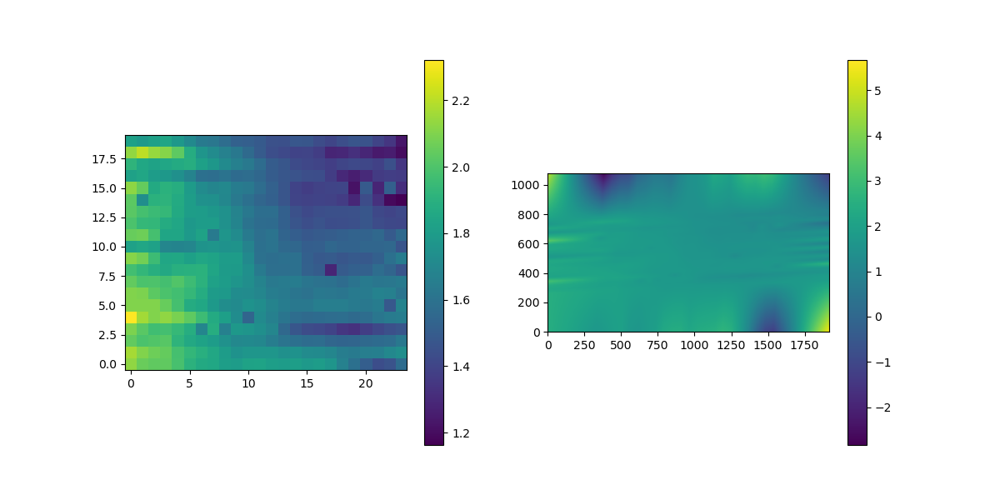

In [170]:
# compare data and extrapolation
f, ax = plt.subplots(ncols=2, figsize=(12,6))
_im = ax[0].imshow(phase_in.T, cmap='viridis', origin='lower')
plt.colorbar(_im,ax=ax[0])
phase_interp = interp((UX, UY))
_im2 = ax[1].imshow(phase_interp, cmap='viridis', origin='lower')
plt.colorbar(_im2, ax=ax[1])

In [123]:
phase_interp.shape

(1080, 1920)

In [124]:
# export the interpolated phase to a netcdf file
xr_phase = xr.DataArray(phase_interp, coords={'py': np.arange(phase_interp.shape[0]), 'px': np.arange(phase_interp.shape[1])}, dims=['py', 'px'])

In [125]:
xr_phase.to_netcdf('phasemaps/phase_interp_0529_1.nc')

In [171]:
order = 6
cart = RZern(order)
plt_cart = RZern(order)
L, K = phase_raw.shape
eps= 0.0
# ddx = np.linspace(-1.0+eps, 1.0-eps, K)
# ddy = np.linspace(-1.0+eps, 1.0-eps, L)
# xv, yv = np.meshgrid(ddx, ddy)
cart.make_cart_grid(xv, yv, unit_circle=False)



In [172]:

plt_ddx = np.linspace(-1.0+eps, 1.0-eps, 100)
plt_ddy = np.linspace(-1.0+eps, 1.0-eps, 100)
plt_xv, plt_yv = np.meshgrid(plt_ddx, plt_ddy, indexing='ij')
# plt_cart.make_cart_grid(plt_xv, plt_yv, unit_circle=False)

plt_cart.make_cart_grid(UX, UY, unit_circle=False)


#c0 = np.random.normal(size=cart.nk)
#Phi = cart.eval_grid(c0, matrix=True)
# Phi = np.fliplr(phaseMap) # maybe better?
#Phi = np.flipud(np.fliplr(phaseMap))
Phi = unwrap_phase(phase_raw.copy())
Phi[mask.astype(bool)] = np.nan

c1 = cart.fit_cart_grid(Phi)[0]
fitp = cart.eval_grid(c1, matrix=True)


In [173]:

c1_red = c1.copy()
c1_red[0:3] = 0
fit_plt = plt_cart.eval_grid(c1_red, matrix=True)

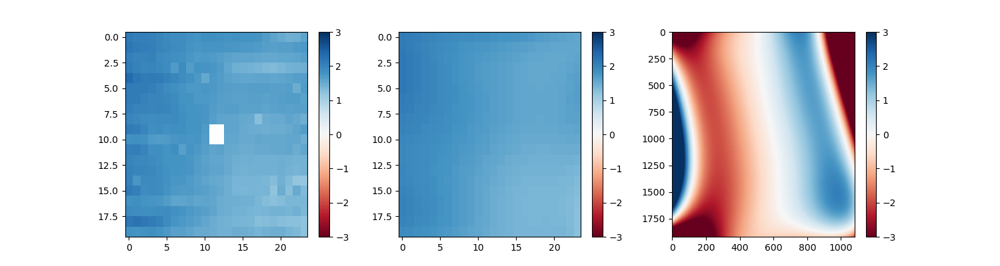

In [175]:
f, ax = plt.subplots(ncols=3, figsize=(15,4))
vmin, vmax = -3, 3
im1 = ax[0].imshow(Phi.T, interpolation='none', aspect='auto', cmap='RdBu', vmin=vmin, vmax=vmax)
im2 = ax[1].imshow(fitp.T, interpolation='none', aspect='auto', cmap='RdBu', vmin=vmin, vmax=vmax)
im3 = ax[2].imshow(fit_plt.T, interpolation='none', aspect='auto', cmap='RdBu', vmin=vmin, vmax=vmax)
plt.colorbar(im1, ax=ax[0])
plt.colorbar(im2, ax=ax[1])
plt.colorbar(im3, ax=ax[2])

In [136]:
xv, yv, dmd = make_grid(im_cent)

phaseMap = phase_fit
phaseMap -= np.mean(phaseMap)
mask = np.zeros_like(phaseMap)

numCols = im_cent.coords['DMD_Prb_X'].size
numRows = im_cent.coords['DMD_Prb_Y'].size

# mask[:,-1] = 1 # right edge
mask[numCols//2-1:numCols//2+1, numRows//2-1:numRows//2+1] = 1 # center 4
# mask[-1,:] = 1 # bottom edge
mask[-1, -4:] = 1
mask[-2:, -1] = 1

ain = np.ma.array(phaseMap, mask=mask)
# if debug:
#     f,ax = plt.subplots()
#     _im = ax.imshow(ain.T, origin='lower', interpolation='none', aspect='auto', cmap='RdBu')
#     plt.colorbar(_im,ax=ax)
    
fit_plt, c1 = fit_zernike(ain)

plt.figure()
plt.bar(np.arange(len(c1)),c1)

-931.4838972249566 931.4838972249566 -540.0 540.0


ValueError: too many values to unpack (expected 3)

In [178]:
Npre = 0
Nholograms = 36
Nframes = int((Nholograms + Npre))
cam.c.ExposureTime = 100.0
cam.c.start()
err, imbuffer, imfiles, metabuffer = cam.GrabImages(shutter=0.40, gain=0.0, number=Nframes, runname="test1", foldername="LG")
cam.c.stop()

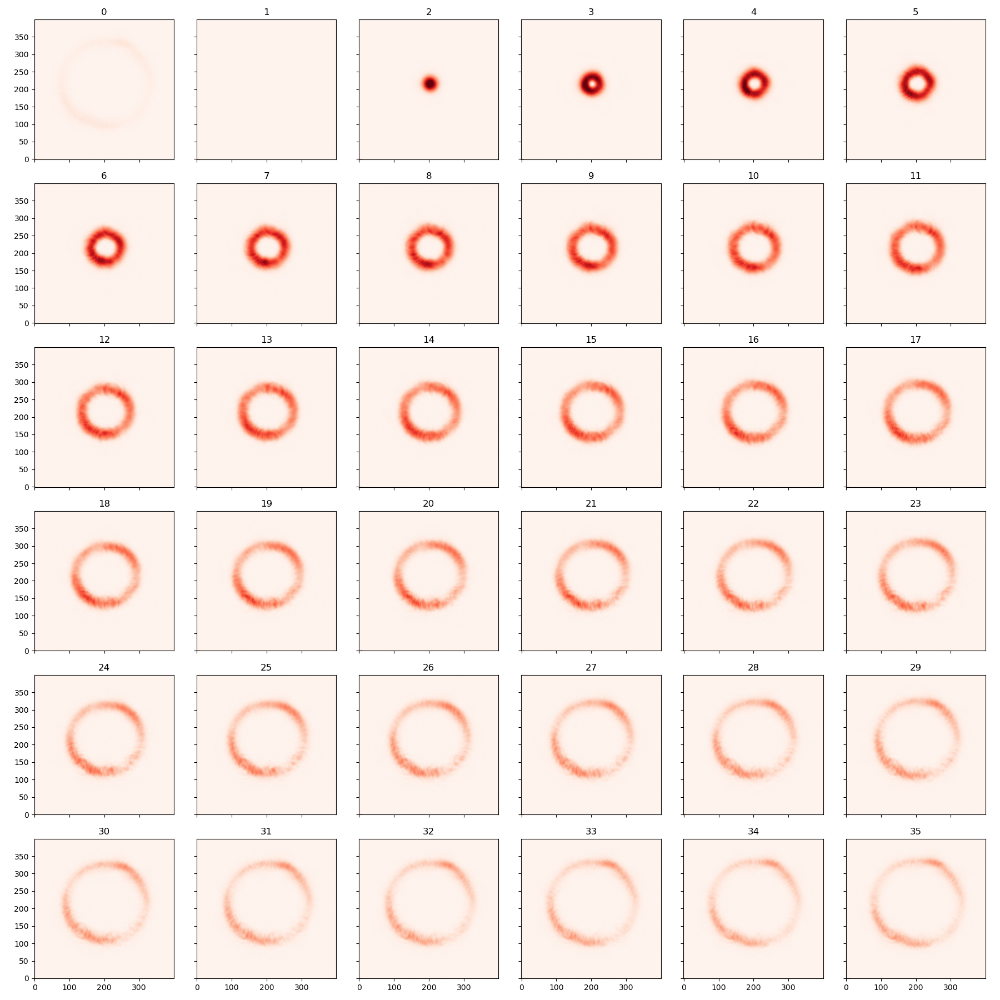

In [179]:
Nim = len(imbuffer)
Ncols = 6
Nrows = int(np.ceil(Nim/Ncols))
f, ax = plt.subplots(ncols=Ncols, nrows=Nrows, sharex=True, sharey=True, figsize=(3*Ncols, 3*Nrows))

for i in range(Nim):
    frame_id, frame_time = metabuffer[i]
    c = i%Ncols
    r = i//Ncols
    ax[r,c].imshow(imbuffer[i].T, origin='lower', cmap='Reds')
    # ax[r,c].imshow(imbuffer[i-1].T, origin='lower', cmap='grey', alpha=0.5)
    ax[r,c].set_title(frame_id)
    # plt.colorbar()
plt.tight_layout()
plt.show()

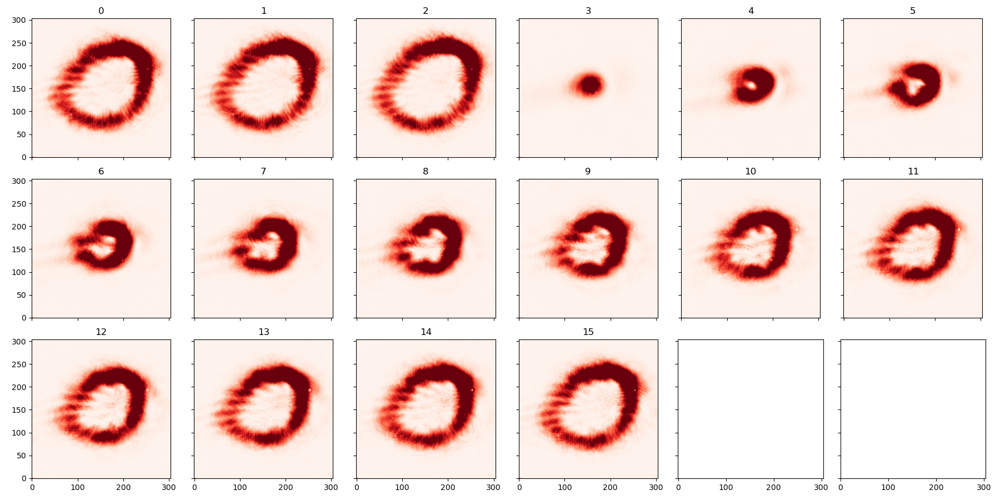

In [105]:
Nim = len(imbuffer)
Ncols = 6
Nrows = int(np.ceil(Nim/Ncols))
f, ax = plt.subplots(ncols=Ncols, nrows=Nrows, sharex=True, sharey=True, figsize=(3*Ncols, 3*Nrows))

for i in range(Nim):
    frame_id, frame_time = metabuffer[i]
    c = i%Ncols
    r = i//Ncols
    ax[r,c].imshow(imbuffer[i].T, origin='lower', cmap='Reds')
    # ax[r,c].imshow(imbuffer[i-1].T, origin='lower', cmap='grey', alpha=0.5)
    ax[r,c].set_title(frame_id)
    # plt.colorbar()
plt.tight_layout()
plt.show()

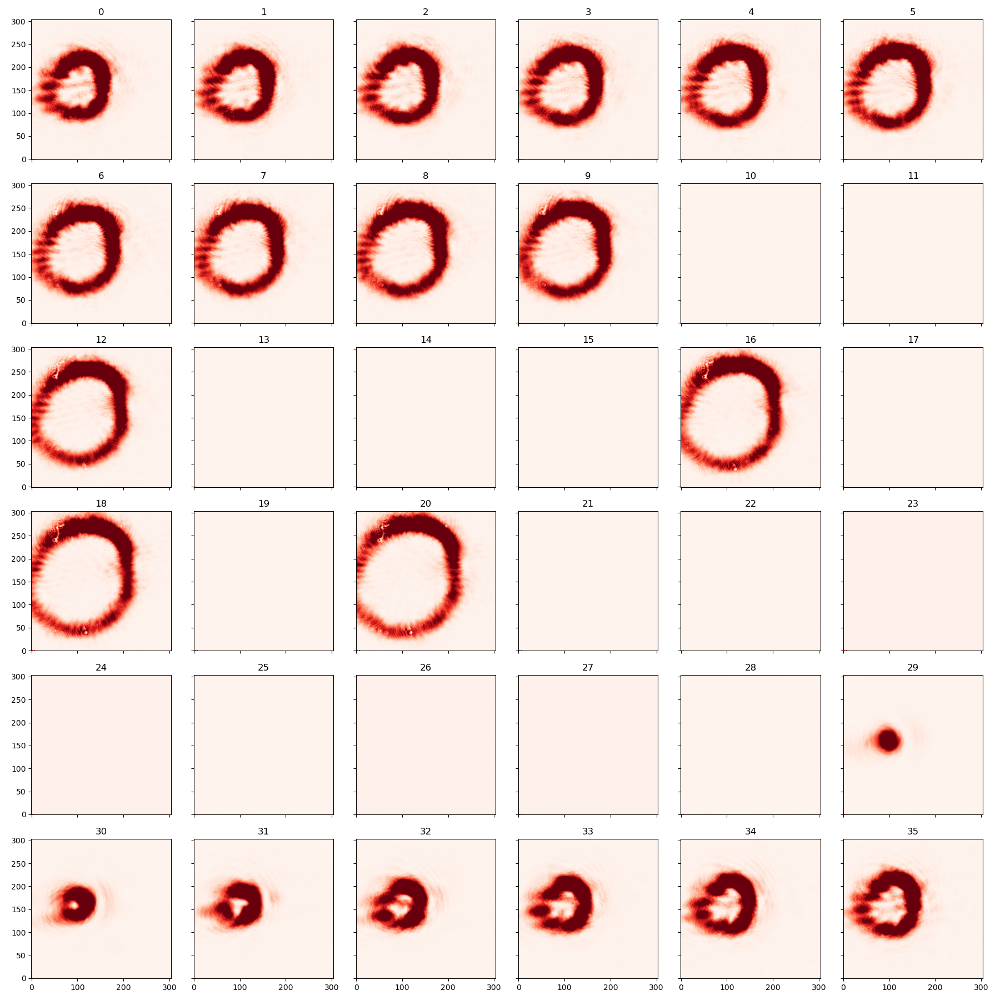

In [112]:
Nim = len(imbuffer)
Ncols = 6
Nrows = int(np.ceil(Nim/Ncols))
f, ax = plt.subplots(ncols=Ncols, nrows=Nrows, sharex=True, sharey=True, figsize=(3*Ncols, 3*Nrows))

for i in range(Nim):
    frame_id, frame_time = metabuffer[i]
    c = i%Ncols
    r = i//Ncols
    ax[r,c].imshow(imbuffer[i].T, origin='lower', cmap='Reds')
    # ax[r,c].imshow(imbuffer[i-1].T, origin='lower', cmap='grey', alpha=0.5)
    ax[r,c].set_title(frame_id)
    # plt.colorbar()
plt.tight_layout()
plt.show()

(array([1902.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
         506.]),
 array([-0.00980459, -0.00563853, -0.00147248,  0.00269357,  0.00685963,
         0.01102568,  0.01519173,  0.01935779,  0.02352384,  0.02768989,
         0.03185595]),
 <BarContainer object of 10 artists>)

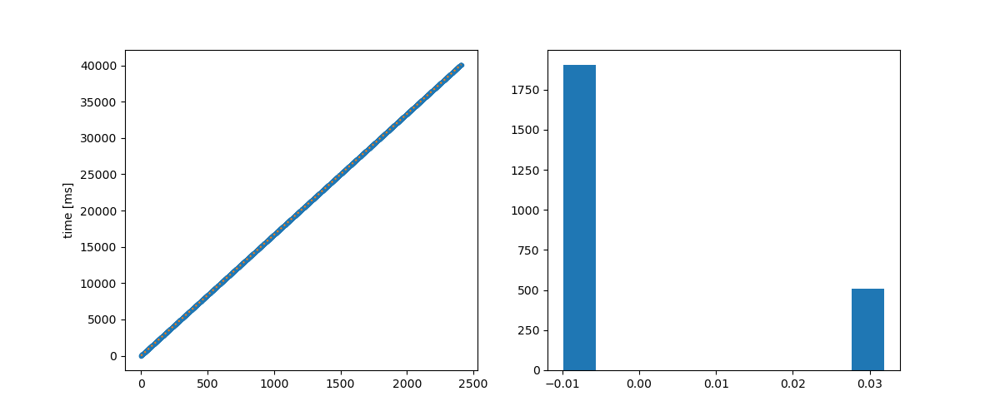

In [259]:
meta_arr = np.array(metabuffer)
times = meta_arr[:,1] - meta_arr[0,1]

fps = 1.0/(np.diff(times)*1e-9)
fps, np.mean(fps)

# plt.figure()
f, ax = plt.subplots(ncols=2, figsize=(12, 5))
ax[0].plot(times*1e-6, marker='.', ls='none')
ax[0].plot(np.arange(Nframes), np.arange(Nframes)*1e3/(60), ls=':')
ax[0].set_ylabel('time [ms]')

# plt.figure()
ax[1].hist(fps - np.mean(fps))

(array([59.99240736, 59.99211944, 59.99240736, ..., 59.99200427,
        59.99237857, 59.9922634 ]),
 60.0003116904314)

(array([1902.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
         506.]),
 array([-0.00980459, -0.00563853, -0.00147248,  0.00269357,  0.00685963,
         0.01102568,  0.01519173,  0.01935779,  0.02352384,  0.02768989,
         0.03185595]),
 <BarContainer object of 10 artists>)

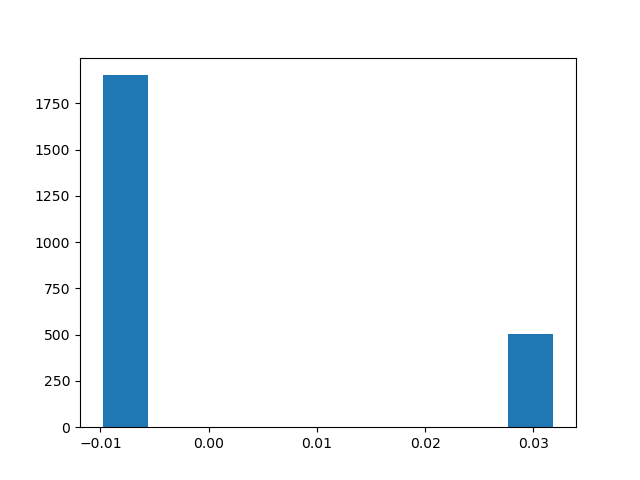

In [202]:
cam.c.close()